https://www.kaggle.com/datasets/deepcontractor/is-that-santa-image-classification/code

I started with a simple image recognition model to find Santa Claus pictures.  At first, the model relied mostly on the red color of Santa's suit.  Now, I'm making the model smarter!  I'm using a special technique to change the colors in Santa's pictures.  This will help the model learn to recognize Santa even when his suit isn't red.  By the end, I'll see if this trick helps the model find Santa more accurately.

# data preparing

In [ ]:
import os
import random
import zipfile
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, MaxPool2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Load images data

In [ ]:
# Define the paths to the zip files
a_santa_zip_path = '/content/drive/MyDrive/is_that_santa/cnn/a_santa.zip'
not_a_santa_zip_path = '/content/drive/MyDrive/is_that_santa/cnn/not_a_santa.zip'

# Define the extraction directories
extracted_a_santa_dir = '/content/a_santa_images'
extracted_not_a_santa_dir = '/content/not_a_santa_images'

# Extract the contents of the zip files
with zipfile.ZipFile(a_santa_zip_path, 'r') as a_santa_zip:
    a_santa_zip.extractall(extracted_a_santa_dir)

with zipfile.ZipFile(not_a_santa_zip_path, 'r') as not_a_santa_zip:
    not_a_santa_zip.extractall(extracted_not_a_santa_dir)

In [ ]:
# Get a list of image files from each extracted directory, excluding directories
a_santa_images = [os.path.join(extracted_a_santa_dir, file) for file in os.listdir(extracted_a_santa_dir) if os.path.isfile(os.path.join(extracted_a_santa_dir, file)) and file.endswith(('.jpg', '.jpeg', '.png'))]
not_a_santa_images = [os.path.join(extracted_not_a_santa_dir, file) for file in os.listdir(extracted_not_a_santa_dir) if os.path.isfile(os.path.join(extracted_not_a_santa_dir, file)) and file.endswith(('.jpg', '.jpeg', '.png'))]

# Define the target size for resizing
target_size = (100, 100)  # You can adjust the size as needed
# Load and resize random 'a_santa' image
random_a_santa_image = random.choice(a_santa_images)
a_santa_img_path = os.path.join(extracted_a_santa_dir, random_a_santa_image)
a_santa_img = Image.open(a_santa_img_path)
a_santa_img = a_santa_img.resize(target_size)

# Load and resize random 'not_a_santa' image
random_not_a_santa_image = random.choice(not_a_santa_images)
not_a_santa_img_path = os.path.join(extracted_not_a_santa_dir, random_not_a_santa_image)
not_a_santa_img = Image.open(not_a_santa_img_path)
not_a_santa_img = not_a_santa_img.resize(target_size)


Function to extract labels from filenames

*   Assign label 1 for 'a_santa' images
*   Assign label 0 for 'not_a_santa' images



Size image troubleshooting:
*   Ensure that your input data has the correct shape (num_samples, height, width, channels).
*   Verify that the number of samples in your input data matches the number of labels.
*   Make sure there are no extra dimensions or incorrect reshaping before passing the data to the model.

In [ ]:
def extract_label(filename):
    if 'a_santa' in filename:
        return 1  # Assign label 1 for 'a_santa' images
    elif 'not_a_santa' in filename:
        return 0  # Assign label 0 for 'not_a_santa' images

def load_and_preprocess_image(image_path):
    # Load the image in RGB mode
    image = Image.open(image_path).convert('RGB')
    # Resize the image
    resized_image = image.resize((100, 100))
    # Convert the image to numpy array and normalize
    image_array = np.array(resized_image) / 255.0
    return image_array

# Load and preprocess images
a_santa_data = [load_and_preprocess_image(os.path.join(extracted_a_santa_dir, file)) for file in a_santa_images]
not_a_santa_data = [load_and_preprocess_image(os.path.join(extracted_not_a_santa_dir, file)) for file in not_a_santa_images]

# Generate labels
a_santa_labels = [extract_label(file) for file in a_santa_images]
not_a_santa_labels = [extract_label(file) for file in not_a_santa_images]

# Convert data and labels to numpy arrays
a_santa_data = np.array(a_santa_data)
not_a_santa_data = np.array(not_a_santa_data)
a_santa_labels = np.array(a_santa_labels)
not_a_santa_labels = np.array(not_a_santa_labels)

# Concatenate data and labels
images = np.concatenate((a_santa_data, not_a_santa_data), axis=0)
labels = np.concatenate((a_santa_labels, not_a_santa_labels), axis=0)

print("Shape of images:", images.shape)
print("Shape of labels:", labels.shape)

# Split the data into training and validation sets
train_images, val_images, train_labels, val_labels = train_test_split(images, labels, test_size=0.2, random_state=42)

print("Shape of train_images:", train_images.shape)
print("Shape of val_images:", val_images.shape)
print("Shape of train_labels:", train_labels.shape)
print("Shape of val_labels:", val_labels.shape)
# Count the number of 'a_santa' images
number_of_a_santa_images = len(a_santa_images)

# Count the number of 'not_a_santa' images
number_of_not_a_santa_images = len(not_a_santa_images)

print("Number of 'a_santa' images:", number_of_a_santa_images)
print("Number of 'not_a_santa' images:", number_of_not_a_santa_images)

Shape of images: (616, 100, 100, 3)
Shape of labels: (616,)
Shape of train_images: (492, 100, 100, 3)
Shape of val_images: (124, 100, 100, 3)
Shape of train_labels: (492,)
Shape of val_labels: (124,)
Number of 'a_santa' images: 308
Number of 'not_a_santa' images: 308


plot

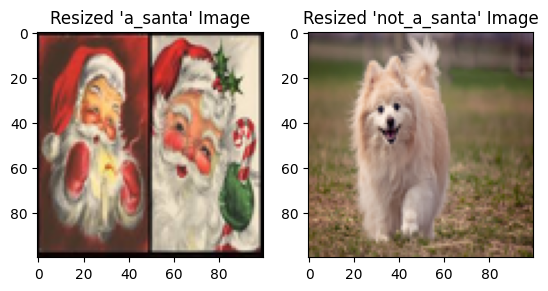

In [ ]:
# Display the resized images
plt.figure()

# Display resized 'a_santa' image
plt.subplot(1, 2, 1)
plt.imshow(a_santa_img)
plt.title("Resized 'a_santa' Image")

# Display resized 'not_a_santa' image
plt.subplot(1, 2, 2)
plt.imshow(not_a_santa_img)
plt.title("Resized 'not_a_santa' Image")

plt.show()

# data augmentation

split a santa and not a santa into each of 10 group

In [ ]:
import copy

# Make a deep copy of the image lists before splitting
a_santa_images_copy = copy.deepcopy(a_santa_images)
not_a_santa_images_copy = copy.deepcopy(not_a_santa_images)

# Calculate the size of each group
group_size = len(a_santa_images) // 10
group_size = len(not_a_santa_images) // 10

a_santa_groups = {}
not_a_santa_groups = {}

# Split 'a_santa' images into 10 groups and name them
for i in range(10):
    group_name = f'a_santa_group_{i+1}'
    a_santa_groups[group_name] = a_santa_images_copy[i * group_size:(i + 1) * group_size]

# Split 'not_a_santa' images into 10 groups and name them
for i in range(10):
    group_name = f'not_a_santa_group_{i+1}'
    not_a_santa_groups[group_name] = not_a_santa_images_copy[i * group_size:(i + 1) * group_size]

print("First group of 'a_santa' images:", a_santa_groups['a_santa_group_1'])
print("First group of 'not_a_santa' images:", not_a_santa_groups['not_a_santa_group_1'])


First group of 'a_santa' images: ['/content/a_santa_images/17.Santa.jpg', '/content/a_santa_images/506.Santa.jpg', '/content/a_santa_images/139.Santa.jpg', '/content/a_santa_images/416.Santa.jpg', '/content/a_santa_images/171.Santa.jpg', '/content/a_santa_images/437.Santa.jpg', '/content/a_santa_images/200.Santa.jpg', '/content/a_santa_images/609.Santa.jpg', '/content/a_santa_images/579.Santa.jpg', '/content/a_santa_images/225.Santa.jpg', '/content/a_santa_images/245.Santa.jpg', '/content/a_santa_images/445.Santa.jpg', '/content/a_santa_images/470.Santa.jpg', '/content/a_santa_images/526.Santa.jpg', '/content/a_santa_images/581.Santa.jpg', '/content/a_santa_images/419.Santa.jpg', '/content/a_santa_images/495.Santa.jpg', '/content/a_santa_images/60.Santa.jpg', '/content/a_santa_images/532.Santa.jpg', '/content/a_santa_images/224.Santa.jpg', '/content/a_santa_images/515.Santa.jpg', '/content/a_santa_images/566.Santa.jpg', '/content/a_santa_images/3.Santa.jpg', '/content/a_santa_images/58

augment fuction

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

color_spaces = [
    cv2.COLOR_RGB2GRAY,
    cv2.COLOR_RGB2YUV,
    cv2.COLOR_RGB2HSV,
    cv2.COLOR_RGB2LAB,
    cv2.COLOR_RGB2HLS,
    cv2.COLOR_RGB2XYZ,
    cv2.COLOR_RGB2YCrCb,
    cv2.COLOR_RGB2Luv,
    cv2.COLOR_RGB2BGR,
    cv2.COLOR_RGB2BGRA
]

def plot_augments(title, image_paths, color_space=None):
    fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16,6))
    plt.suptitle(title, fontsize=16)

    for i in range(12):
        if i >= len(image_paths):
            break  # Break if there are fewer than 12 images

        # Load the image from the path
        image_path = image_paths[i]
        image = np.array(Image.open(image_path).convert('RGB'))

        if image.dtype == np.float64 or image.dtype == np.float32:
            image = (image * 255).astype(np.uint8)

        if color_space is not None:
            image = cv2.cvtColor(image, color_space)

        image = cv2.resize(image, (200,200))

        x = i // 6
        y = i % 6

        axes[x, y].imshow(image, cmap='gray' if color_space == cv2.COLOR_RGB2GRAY else None)
        axes[x, y].axis('off')


Exception ignored in: <function _xla_gc_callback at 0x7943518964d0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


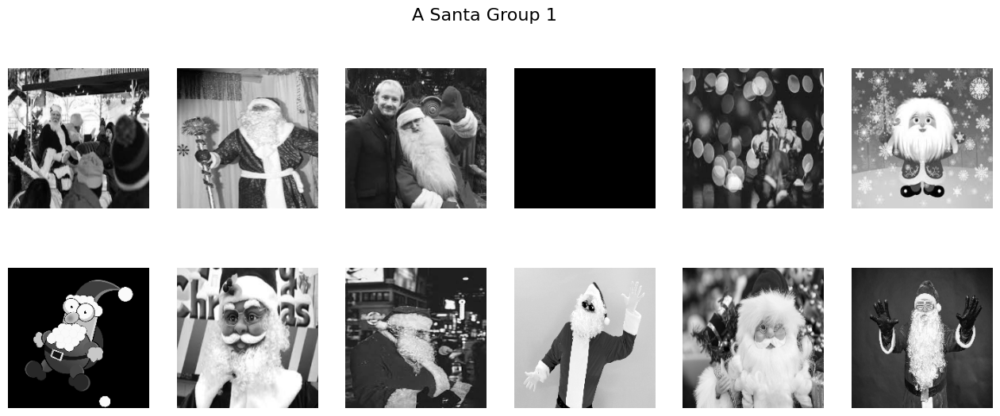

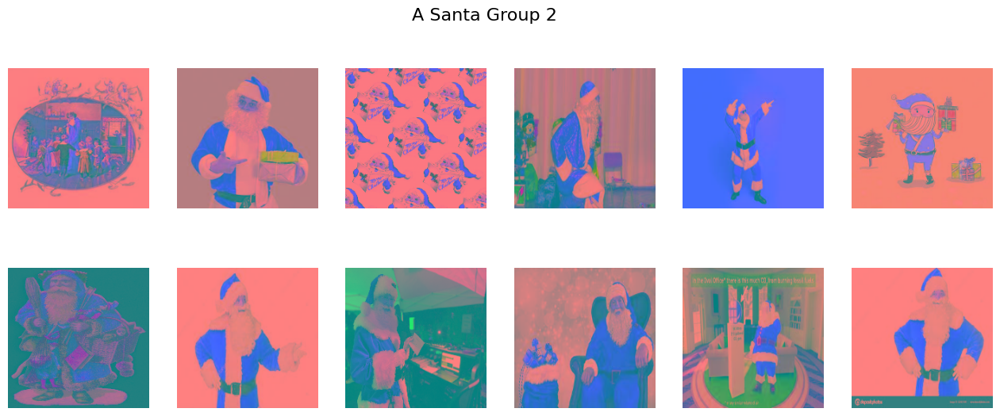

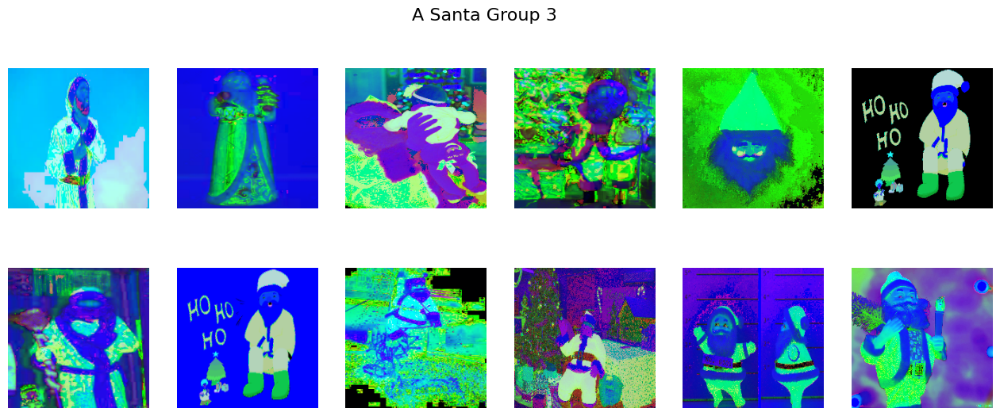

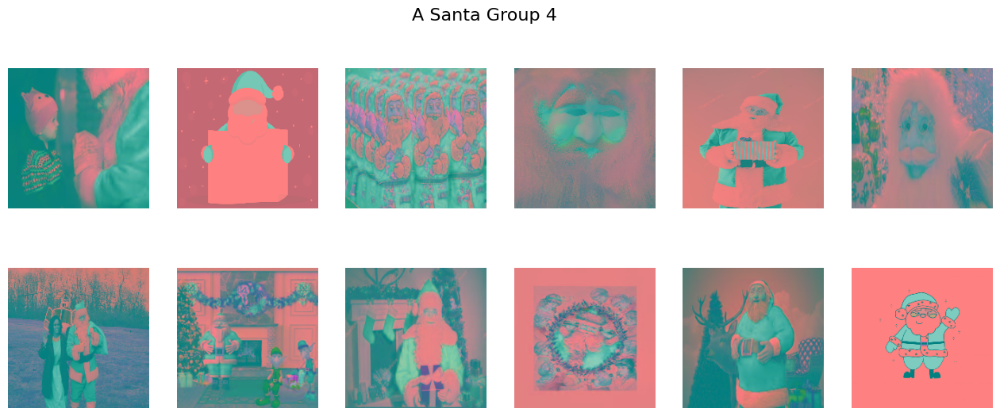

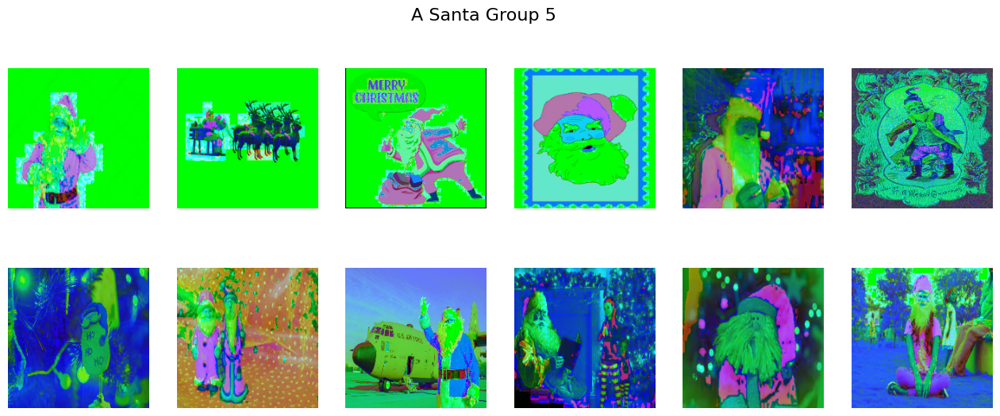

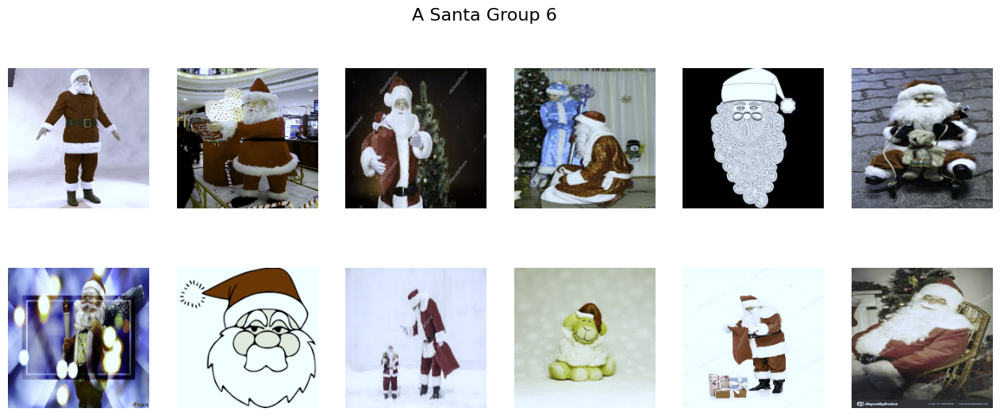

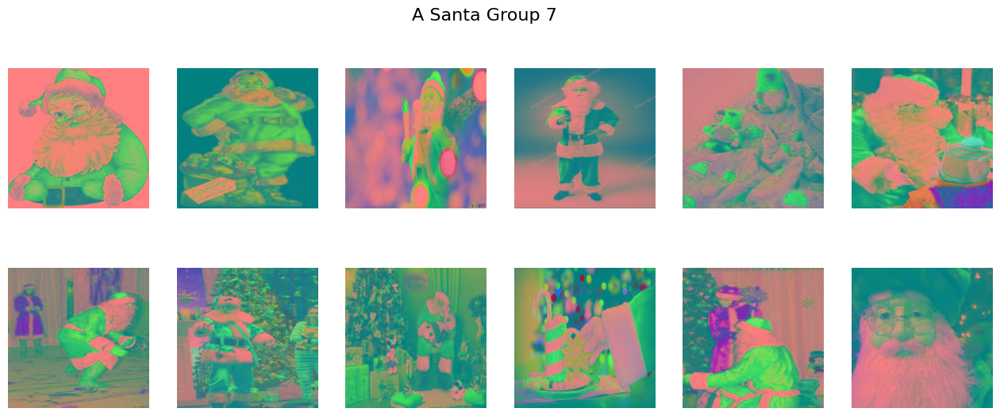

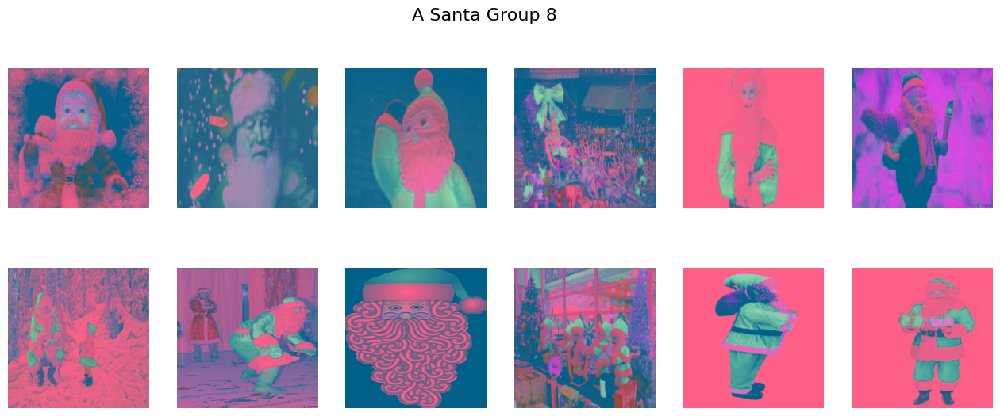

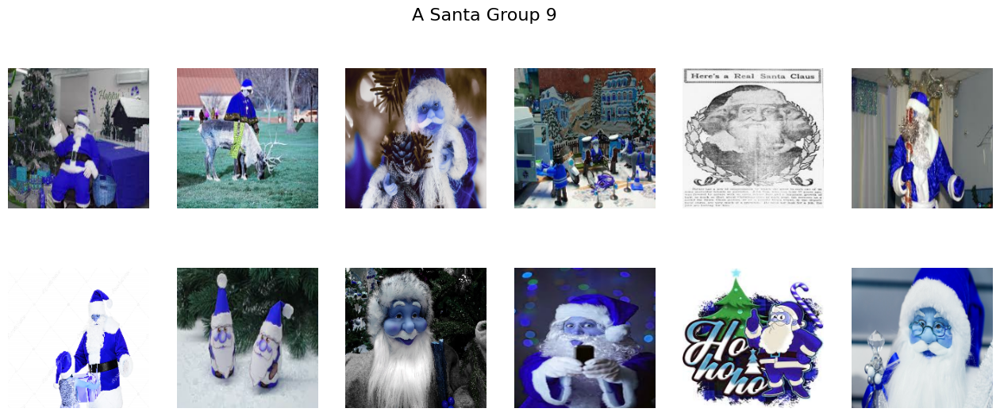

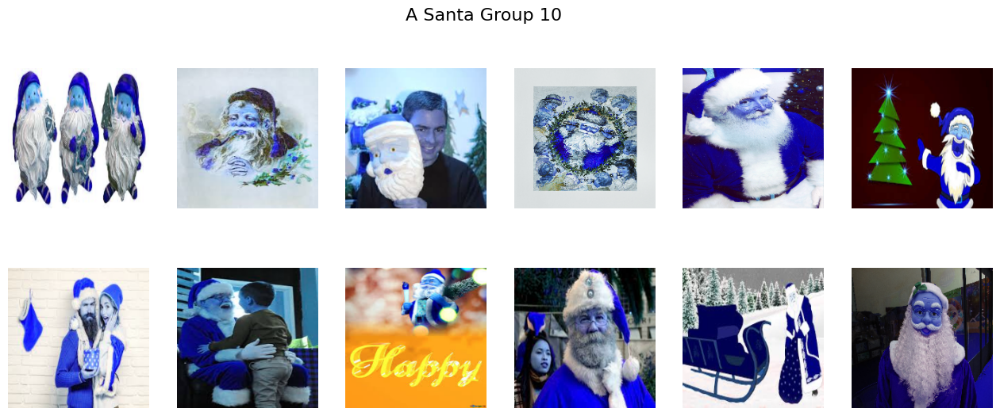

In [ ]:
# Plot each group with a different color space conversion
for i, (group_key, color_space) in enumerate(zip(a_santa_groups.keys(), color_spaces)):
    images = a_santa_groups[group_key]
    plot_augments(f"A Santa Group {i+1}", images, color_space)


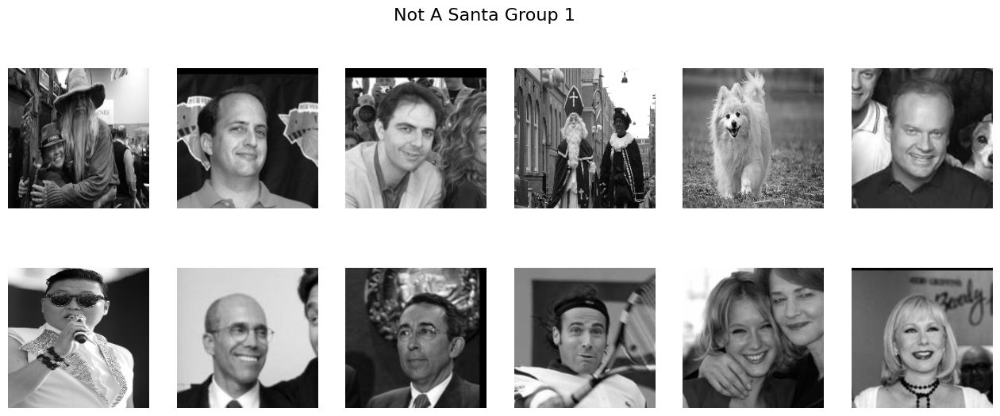

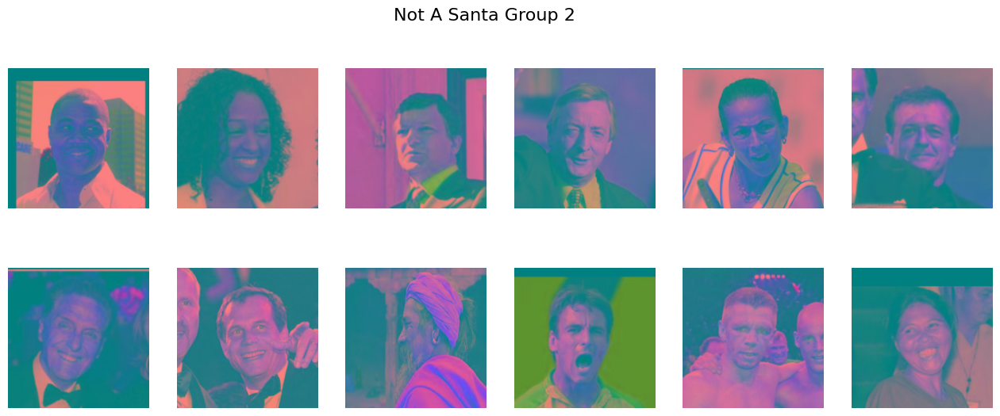

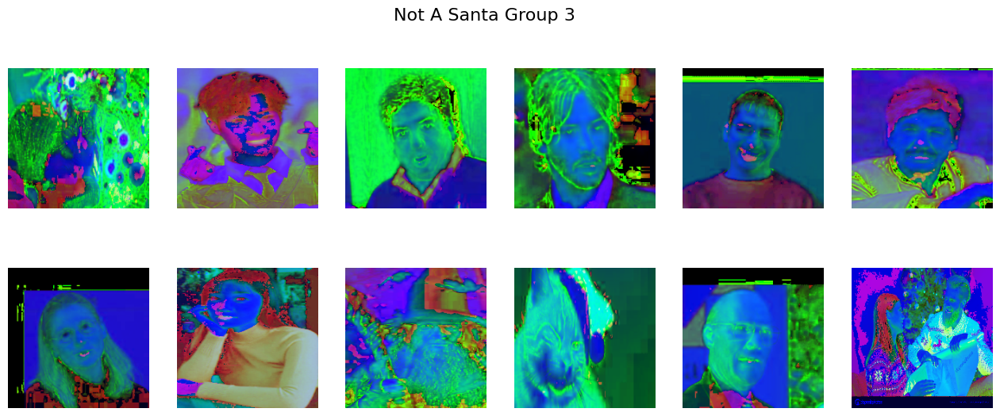

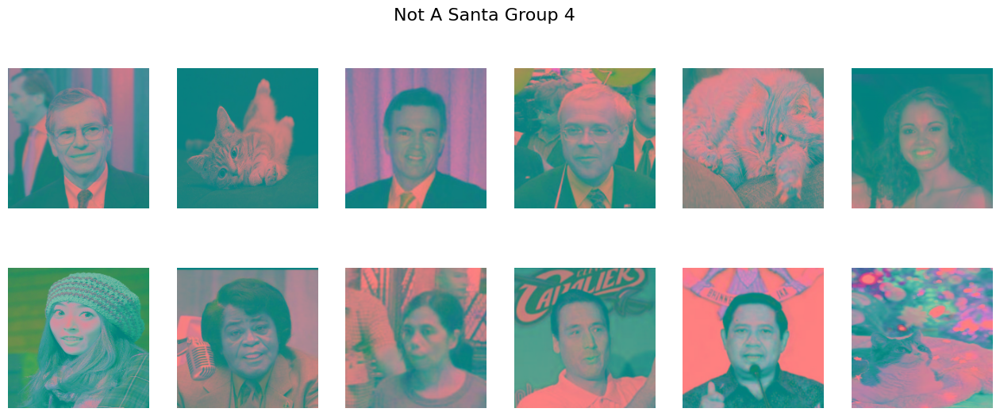

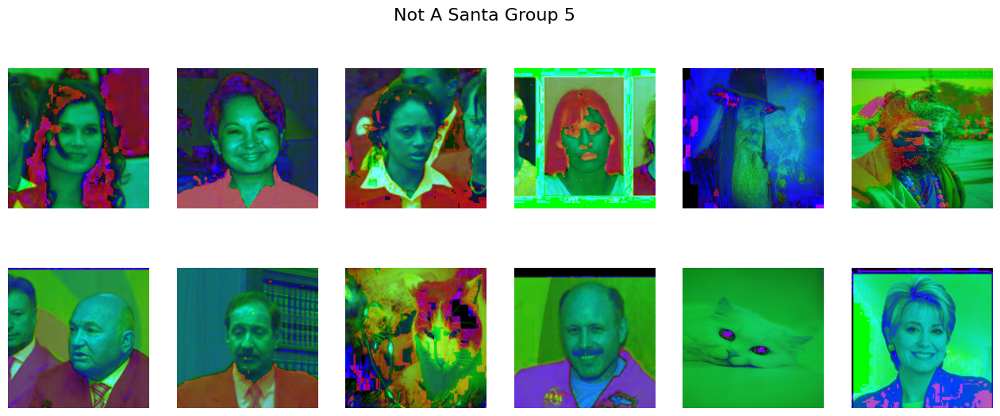

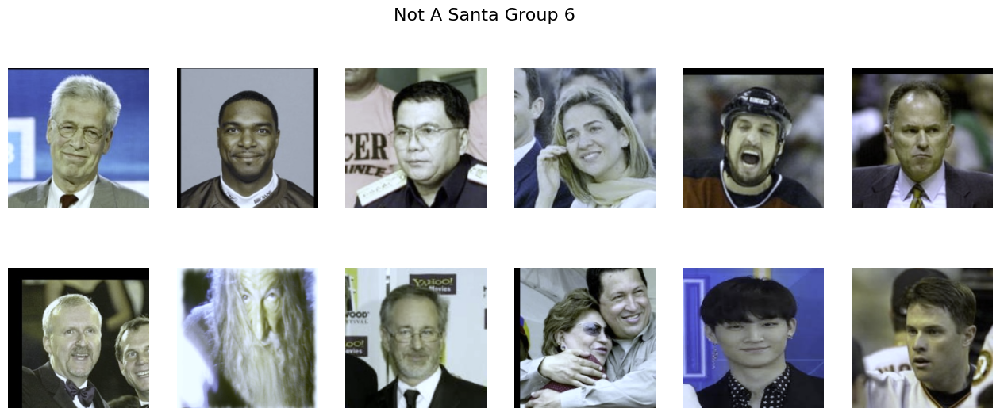

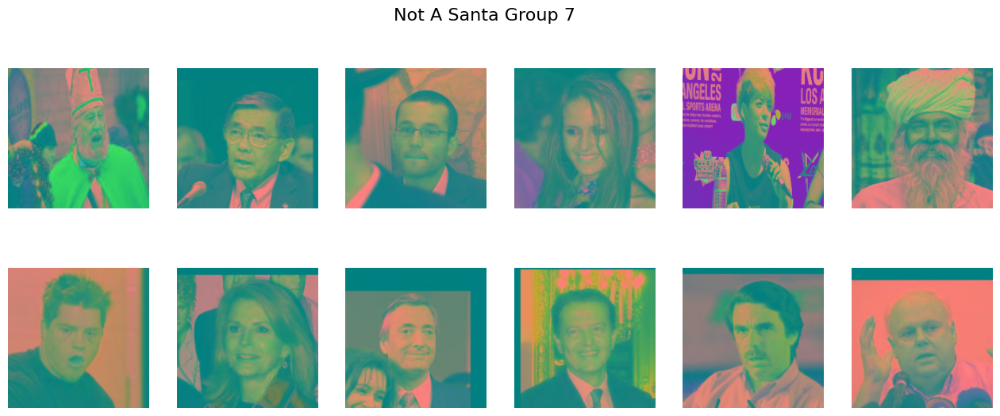

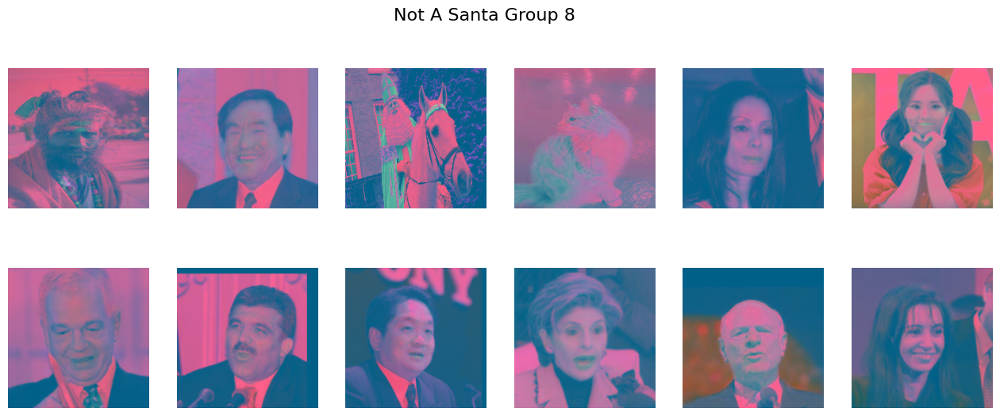

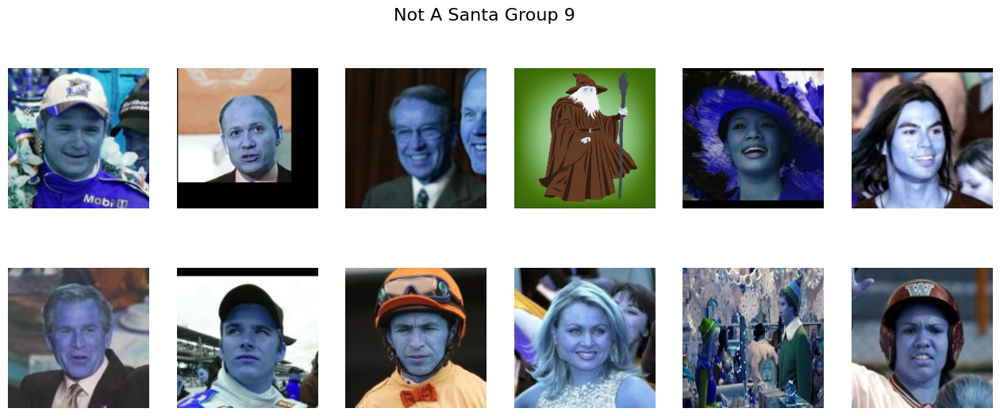

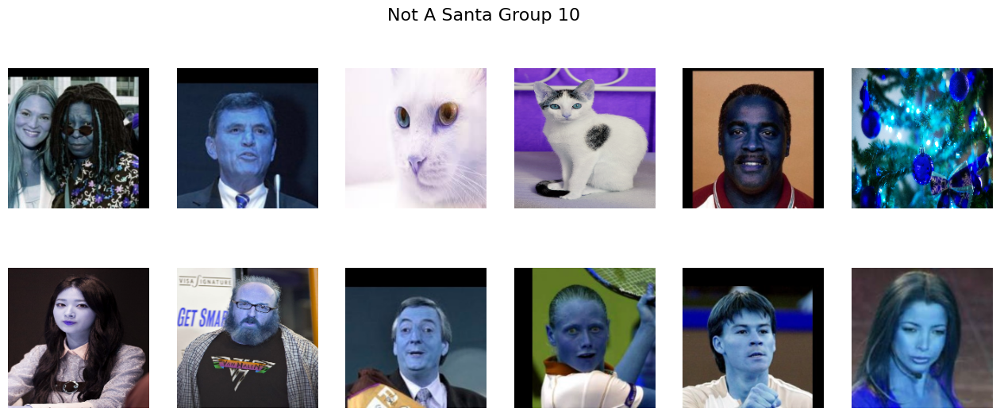

In [ ]:
# Plot each group with a different color space conversion
for i, (group_key, color_space) in enumerate(zip(not_a_santa_groups.keys(), color_spaces)):
    images = not_a_santa_groups[group_key]
    plot_augments(f"Not A Santa Group {i+1}", images, color_space)


To combine all the groups back into a single list for both a_santa and not_a_santa

In [ ]:
# Combine all the 'a_santa' groups back into a single list
combined_a_santa_images = []
for group_name in sorted(a_santa_groups.keys()):
    combined_a_santa_images.extend(a_santa_groups[group_name])

combined_not_a_santa_images = []
for group_name in sorted(not_a_santa_groups.keys()):
    combined_not_a_santa_images.extend(not_a_santa_groups[group_name])

# Verify that the combined lists have the correct number of images
print("Total number of 'augmentation_a_santa' images after combining:", len(combined_a_santa_images))
print("Total number of 'augmentation_a_not_santa' images after combining:", len(combined_not_a_santa_images))
print("Total number of 'a_santa' images after combining:", len(a_santa_images))
print("Total number of 'a_not_santa' images after combining:", len(not_a_santa_images))

Total number of 'augmentation_a_santa' images after combining: 300
Total number of 'augmentation_a_not_santa' images after combining: 300
Total number of 'a_santa' images after combining: 308
Total number of 'a_not_santa' images after combining: 308


In [ ]:
# Preprocess all images and create labels
processed_a_santa_images = [load_and_preprocess_image(img) for img in combined_a_santa_images]
processed_not_a_santa_images = [load_and_preprocess_image(img) for img in combined_not_a_santa_images]

processed_a_santa_labels = [1 for _ in combined_a_santa_images]
processed_not_a_santa_labels = [0 for _ in combined_not_a_santa_images]

# Combine data and labels
processed_images = np.array(processed_a_santa_images + processed_not_a_santa_images)
processed_labels = np.array(processed_a_santa_labels + processed_not_a_santa_labels)

# Shuffle the dataset
indices = np.arange(processed_images.shape[0])
np.random.shuffle(indices)
processed_images = processed_images[indices]
processed_labels = processed_labels[indices]

# Split the data into training and validation sets
train_images2, val_images2, train_labels2, val_labels2 = train_test_split(processed_images, processed_labels, test_size=0.2, random_state=42)


# training

## model 1 : without augmentation

In [ ]:
# create CNN Model
model = Sequential()
model.add(Conv2D(filters=32, kernel_size=(4, 4), input_shape=(100, 100, 3), activation='relu'))  # Convolutional Layer (1st)
model.add(MaxPool2D(pool_size=(2, 2)))                                                           # MaxPooling Layer (1st)
model.add(Conv2D(filters=32, kernel_size=(4, 4), activation='relu'))                             # Convolutional Layer (2nd)
model.add(MaxPool2D(pool_size=(2, 2)))                                                           # MaxPooling Layer (2nd)
model.add(Flatten())                                                                             # Flatten Layer
model.add(Dense(256, activation='relu'))                                                         # Fully Connected Dense Layer (1st)
model.add(Dense(1, activation='sigmoid'))                                                        # Fully Connected Dense Layer (2nd, Output)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 97, 97, 32)        1568      
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 45, 45, 32)        16416     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 22, 22, 32)        0         
 ng2D)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 15488)             0         
                                                                 
 dense_12 (Dense)            (None, 256)              

In [ ]:
history = model.fit(train_images, train_labels, epochs=10, validation_data=(val_images, val_labels))

Epoch 1/10
16/16 [==============================] - 10s 564ms/step - loss: 0.0452 - accuracy: 0.9736 - val_loss: 2.3178e-24 - val_accuracy: 1.0000
Epoch 2/10
16/16 [==============================] - 7s 416ms/step - loss: 1.9204e-06 - accuracy: 1.0000 - val_loss: 3.0242e-34 - val_accuracy: 1.0000
Epoch 3/10
16/16 [==============================] - 8s 488ms/step - loss: 1.8445e-07 - accuracy: 1.0000 - val_loss: 7.0944e-37 - val_accuracy: 1.0000
Epoch 4/10
16/16 [==============================] - 8s 476ms/step - loss: 5.6001e-08 - accuracy: 1.0000 - val_loss: 1.7857e-37 - val_accuracy: 1.0000
Epoch 5/10
16/16 [==============================] - 7s 436ms/step - loss: 5.0603e-08 - accuracy: 1.0000 - val_loss: 1.2864e-37 - val_accuracy: 1.0000
Epoch 6/10
16/16 [==============================] - 7s 443ms/step - loss: 4.9969e-08 - accuracy: 1.0000 - val_loss: 1.1666e-37 - val_accuracy: 1.0000
Epoch 7/10
16/16 [==============================] - 6s 371ms/step - loss: 4.9024e-08 - accuracy: 1.0000

In [ ]:
metrics = pd.DataFrame(model.history.history)
metrics

,loss,accuracy,val_loss,val_accuracy
0,4.517039e-02,0.973577,2.317844e-24,1.0
1,1.920357e-06,1.000000,3.024218e-34,1.0
2,1.844540e-07,1.000000,7.094410e-37,1.0
3,5.600057e-08,1.000000,1.785746e-37,1.0
4,5.060317e-08,1.000000,1.286440e-37,1.0
5,4.996858e-08,1.000000,1.166636e-37,1.0
6,4.902418e-08,1.000000,1.117044e-37,1.0
7,4.825594e-08,1.000000,1.097185e-37,1.0
8,4.733614e-08,1.000000,1.013013e-37,1.0
9,4.640160e-08,1.000000,9.714933e-38,1.0


4/4 [==============================] - 0s 73ms/step - loss: 9.7149e-38 - accuracy: 1.0000
Validation loss: 9.714933203858806e-38
Validation accuracy: 1.0


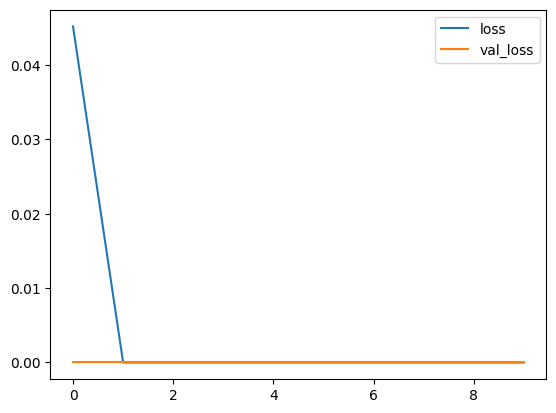

In [ ]:
metrics[['loss', 'val_loss']].plot()
# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_images, val_labels)

# Print the results
print(f'Validation loss: {val_loss}')
print(f'Validation accuracy: {val_accuracy}')

## model 2 : with augmentation

In [ ]:
# Define the model
model2 = Sequential([
    Conv2D(filters=32, kernel_size=(4, 4), input_shape=(100, 100, 3), activation='relu'),
    MaxPool2D(pool_size=(2, 2)),
    Conv2D(filters=64, kernel_size=(4, 4), activation='relu'),
    MaxPool2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(1, activation='sigmoid')
])


In [ ]:
model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model summary
model2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 97, 97, 32)        1568      
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 48, 48, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_15 (Conv2D)          (None, 45, 45, 64)        32832     
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 22, 22, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_7 (Flatten)         (None, 30976)             0         
                                                                 
 dense_14 (Dense)            (None, 256)              

In [ ]:
# Train the model
history2 = model2.fit(train_images2, train_labels2, epochs=10, validation_data=(val_images2, val_labels2))


Epoch 1/10
15/15 [==============================] - 9s 541ms/step - loss: 0.8053 - accuracy: 0.6313 - val_loss: 0.4254 - val_accuracy: 0.8167
Epoch 2/10
15/15 [==============================] - 9s 564ms/step - loss: 0.3455 - accuracy: 0.8729 - val_loss: 0.2889 - val_accuracy: 0.8917
Epoch 3/10
15/15 [==============================] - 9s 594ms/step - loss: 0.2078 - accuracy: 0.9208 - val_loss: 0.2557 - val_accuracy: 0.8833
Epoch 4/10
15/15 [==============================] - 7s 481ms/step - loss: 0.1205 - accuracy: 0.9583 - val_loss: 0.3028 - val_accuracy: 0.8750
Epoch 5/10
15/15 [==============================] - 8s 545ms/step - loss: 0.0778 - accuracy: 0.9667 - val_loss: 0.2830 - val_accuracy: 0.8917
Epoch 6/10
15/15 [==============================] - 9s 607ms/step - loss: 0.0386 - accuracy: 0.9854 - val_loss: 0.3389 - val_accuracy: 0.8833
Epoch 7/10
15/15 [==============================] - 7s 475ms/step - loss: 0.0136 - accuracy: 0.9979 - val_loss: 0.3565 - val_accuracy: 0.8750
Epoch 

# predict

In [ ]:
# Corrected function to load and preprocess the image from uploaded bytes
def load_and_preprocess_Newimage(uploaded_image_bytes):
    # Convert bytes data to a file-like object
    img = Image.open(io.BytesIO(uploaded_image_bytes)).convert('RGB')
    # Resize the image
    img = img.resize((100, 100))  # Resize the image to 100x100 pixels
    # Convert to numpy array and normalize
    img_array = np.array(img) / 255.0
    # Add batch dimension
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

upload new input to classtify SANTA!

Saving Screenshot 2567-03-16 at 23.41.08.png to Screenshot 2567-03-16 at 23.41.08 (2).png
1/1 [==============================] - 0s 22ms/step


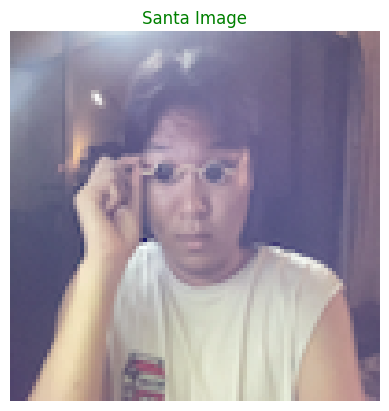

Model 1 prediction for 'Screenshot 2567-03-16 at 23.41.08 (2).png': Santa (score: 1.0)
1/1 [==============================] - 0s 26ms/step


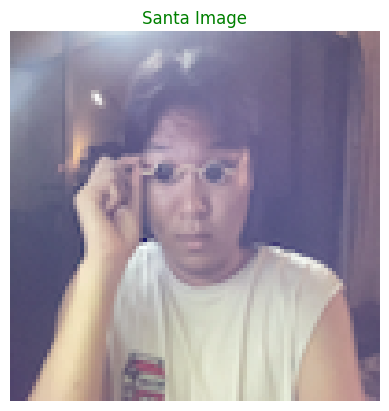

Model 2 prediction for 'Screenshot 2567-03-16 at 23.41.08 (2).png': Santa (score: 0.966920793056488)


In [ ]:
from google.colab import files
import io

# Upload the image
uploaded = files.upload()

# model 1 predictions
for fn, content in uploaded.items():
    processed_image = load_and_preprocess_Newimage(content)

    prediction = model.predict(processed_image)
    plt.figure()
    plt.imshow(processed_image[0])  # Show the first (and only) image

    title_text = "Santa" if prediction[0][0] > 0.5 else "Not Santa"
    title_color = 'green' if title_text == "Santa" else 'red'

    plt.title(f"{title_text} Image", color=title_color)
    plt.axis('off')
    plt.show()
    print(f"Model 1 prediction for '{fn}': {title_text} (score: {prediction[0][0]})")

# model 2 predictions
for fn, content in uploaded.items():
    processed_image = load_and_preprocess_Newimage(content)

    prediction = model2.predict(processed_image)
    plt.figure()
    plt.imshow(processed_image[0])  # Show the first (and only) image

    title_text = "Santa" if prediction[0][0] > 0.5 else "Not Santa"
    title_color = 'green' if title_text == "Santa" else 'red'

    plt.title(f"{title_text} Image", color=title_color)
    plt.axis('off')
    plt.show()
    print(f"Model 2 prediction for '{fn}': {title_text} (score: {prediction[0][0]})")

# Compare 2 models

To compare model and model2, use metrics such as accuracy, loss, and potentially.

*  Train both models: Ensure both model and model2 have been trained on the same
*  Evaluate the models: Use the evaluate method to assess the performance of each model on a test set (or validation set if a separate test set is not available).

*   Visualize the training process: Plot the training and validation accuracy/loss over epochs for each model to compare their learning behavior.
Here is a structured way to do this:



## Evaluate

In [ ]:
# Evaluate the first model
model_loss, model_accuracy = model.evaluate(val_images, val_labels)
print(f"Model 1 - Loss: {model_loss}, Accuracy: {model_accuracy}")

# Evaluate the second model
model2_loss, model2_accuracy = model2.evaluate(val_images2, val_labels2)
print(f"Model 2 - Loss: {model2_loss}, Accuracy: {model2_accuracy}")

4/4 [==============================] - 0s 117ms/step - loss: 9.7149e-38 - accuracy: 1.0000
Model 1 - Loss: 9.714933203858806e-38, Accuracy: 1.0
4/4 [==============================] - 0s 92ms/step - loss: 0.4797 - accuracy: 0.8667
Model 2 - Loss: 0.47968465089797974, Accuracy: 0.8666666746139526


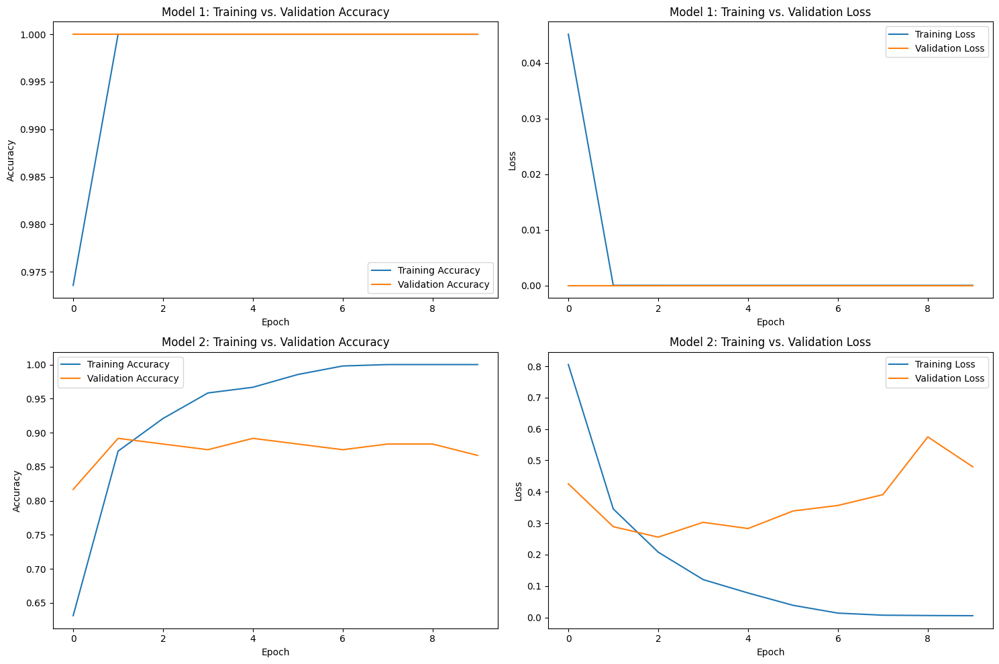

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # 2x2 grid, larger figure size

# Training and validation accuracy for Model 1
axs[0, 0].plot(history.history['accuracy'], label='Training Accuracy')
axs[0, 0].plot(history.history['val_accuracy'], label='Validation Accuracy')
axs[0, 0].set_title('Model 1: Training vs. Validation Accuracy')
axs[0, 0].set_ylabel('Accuracy')
axs[0, 0].set_xlabel('Epoch')
axs[0, 0].legend()

# Training and validation loss for Model 1
axs[0, 1].plot(history.history['loss'], label='Training Loss')
axs[0, 1].plot(history.history['val_loss'], label='Validation Loss')
axs[0, 1].set_title('Model 1: Training vs. Validation Loss')
axs[0, 1].set_ylabel('Loss')
axs[0, 1].set_xlabel('Epoch')
axs[0, 1].legend()

# Training and validation accuracy for Model 2
axs[1, 0].plot(history2.history['accuracy'], label='Training Accuracy')
axs[1, 0].plot(history2.history['val_accuracy'], label='Validation Accuracy')
axs[1, 0].set_title('Model 2: Training vs. Validation Accuracy')
axs[1, 0].set_ylabel('Accuracy')
axs[1, 0].set_xlabel('Epoch')
axs[1, 0].legend()

# Training and validation loss for Model 2
axs[1, 1].plot(history2.history['loss'], label='Training Loss')
axs[1, 1].plot(history2.history['val_loss'], label='Validation Loss')
axs[1, 1].set_title('Model 2: Training vs. Validation Loss')
axs[1, 1].set_ylabel('Loss')
axs[1, 1].set_xlabel('Epoch')
axs[1, 1].legend()

plt.tight_layout()
plt.show()


###*Model Comparison*

* Model 1 achieved perfect accuracy (100%) and an extremely low loss and an extremely low loss (nearly 0), which may indicate overfitting, especially if the training set is not diverse or too small.
* Model 2 showed an accuracy of 86.67% with a higher loss of 0.4797. This model might be more generalized compared to Model 1 but still shows room for improvement, possibly through further tuning or using a more diverse training dataset.

 Ensure the model is not overfitting by using techniques such as cross-validation, regularization, or introducing more data.